# Predict House Prices in King County, Washington  

## Overview 

King County, Washington is the most populous county in Washington. It is also the 12th most populous in the United States. Washington's most populous city is Seattle.

Our goal is to predict the price of a house based on houses sold between May 2014 to May 2015 in King County, Washington State, USA.  

In [1]:
#imports
import pandas as pd
import opendatasets as od
import os
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler

# 1. Data Wrangling

## 1.1 Collect

In [2]:
#get the data from API
#https://www.kaggle.com/swathiachath/kc-housesales-data > data with explanations 
housingAPI = od.download("https://www.kaggle.com/shivachandel/kc-house-data")

Skipping, found downloaded files in "./kc-house-data" (use force=True to force download)


In [3]:
#get the data and read it 
housingData = pd.read_csv('./kc-house-data/kc_house_data.csv')

## 1.2 Clean and Organize Data

In [4]:
#cheeck for duplicates
#check for duplicates
housingData.duplicated()

duplicate = housingData[housingData.duplicated()]
print(duplicate)

Empty DataFrame
Columns: [id, date, price, bedrooms, bathrooms, sqft_living, sqft_lot, floors, waterfront, view, condition, grade, sqft_above, sqft_basement, yr_built, yr_renovated, zipcode, lat, long, sqft_living15, sqft_lot15]
Index: []

[0 rows x 21 columns]


In [5]:
#check for any null values
housingData.isnull().values.any()

#check how many null values
housingData.isnull().sum()

# 2 null values are in the sqft_above column > index 10 & 17
housingData[housingData['sqft_above'].isna()]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
10,1736800520,20150403T000000,662500.0,3,2.5,3560,9796,1.0,0,0,...,8,NaN,1700,1965,0,98007,47.6007,-122.145,2210,8925
17,6865200140,20140529T000000,485000.0,4,1.0,1600,4300,1.5,0,0,...,7,NaN,0,1916,0,98103,47.6648,-122.343,1610,4300


In [6]:
#Remove the rows where sqft_above is not NA
newHousingDF = housingData[housingData['sqft_above'].notna()]

newHousingDF.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

# 2. Data Profile

## 2.1

In [7]:
#Show summary of stats with transpose 
newHousingDF.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21611.0,4.580327e+09,2.876592e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21611.0,5.400850e+05,3.671430e+05,7.500000e+04,3.217250e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21611.0,3.370830e+00,9.300916e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21611.0,2.114791e+00,7.701570e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21611.0,2.079853e+03,9.184224e+02,2.900000e+02,1.426000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21611.0,1.510771e+04,4.142235e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068850e+04,1.651359e+06
floors,21611.0,1.494332e+00,5.400034e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21611.0,7.542455e-03,8.652117e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21611.0,2.343251e-01,7.663497e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21611.0,3.409421e+00,6.507548e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


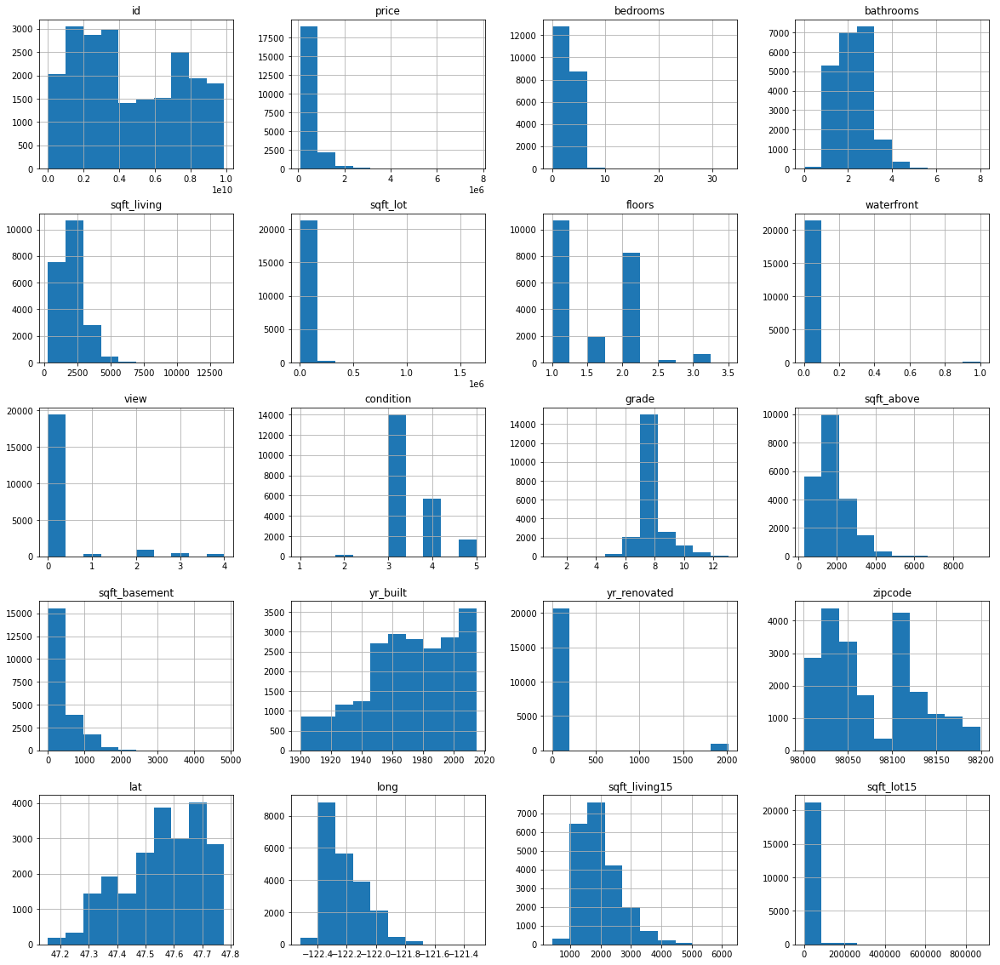

In [8]:
#create histogram for each variable in df 
histogram = newHousingDF.hist(bins=10, figsize=(20,20))

## 2.2 Plotting for categorical variables
code from https://www.python-graph-gallery.com/25-histogram-with-several-variables-seaborn 

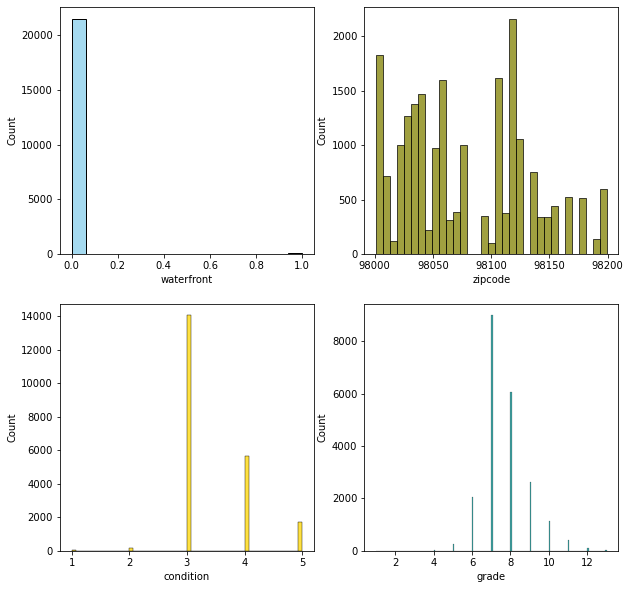

In [9]:
#newHousingDF does have some categorical variables: waterfront, view, condition, grade
#waterfront House which has a view to a waterfront Numeric
#view Has been viewed Numeric
#condition How good the condition is ( Overall ). 1 indicates worn out property and 5 excellent.
#grade overall grade given to the housing unit, based on King County grading system. 1 poor ,13 excellent. Numeric

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

sns.histplot(data=newHousingDF, x="waterfront", color="skyblue", ax=axs[0, 0])
sns.histplot(data=newHousingDF, x="zipcode", color="olive", ax=axs[0, 1])
sns.histplot(data=newHousingDF, x="condition", color="gold", ax=axs[1, 0])
sns.histplot(data=newHousingDF, x="grade", color="teal", ax=axs[1, 1])



plt.show()

## 2.3 Reviewing for Outliers and Anamolies

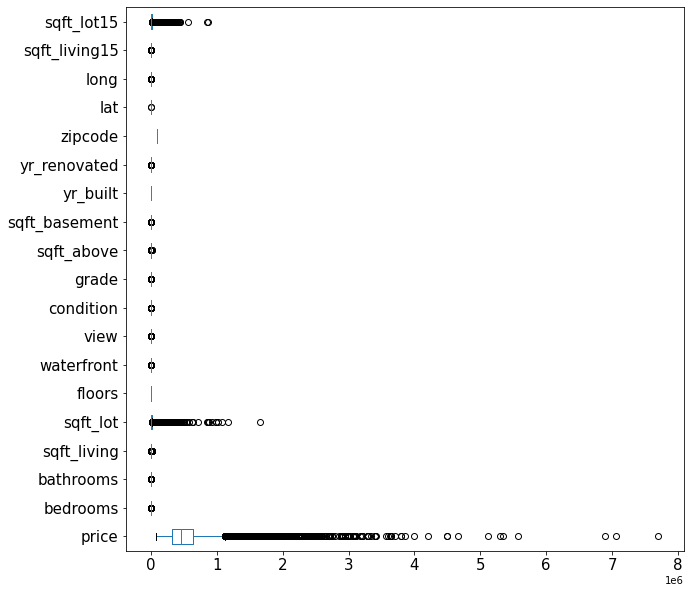

In [10]:
#create a box plot to determine if we have any outliers 

#create a box plot for every column in newHousingDF
figure, ax = plt.subplots(figsize=(10, 10))
boxplot = newHousingDF.drop('id', axis=1).boxplot(grid=False, vert=False,fontsize=15)

catVar = ['waterfront', 'view', 'condition', 'grade']

#Q Might have to add a different one because of categorical variables

### Taking a closer look at the outliers

There are a few outliers that need a closer look.

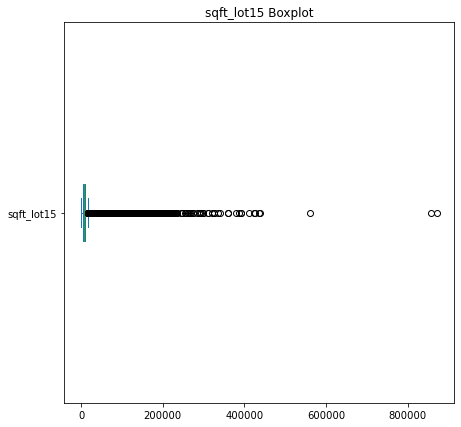

In [11]:
#sqft_lot15
figure, ax = plt.subplots(figsize=(7, 7))
newHousingDF['sqft_lot15'].plot(kind='box', vert=False);
plt.title("sqft_lot15 Boxplot")
plt.show()

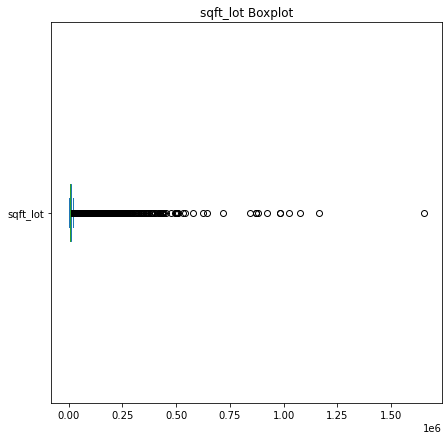

In [12]:
#sqft_lot
figure, ax = plt.subplots(figsize=(7,7))
newHousingDF['sqft_lot'].plot(kind='box', vert=False);

plt.title("sqft_lot Boxplot")
plt.show()

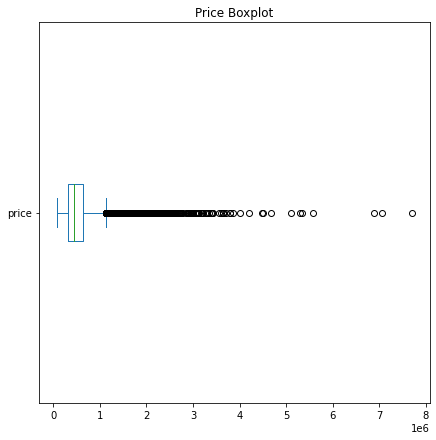

In [13]:
#price
figure, ax = plt.subplots(figsize=(7,7))
newHousingDF['price'].plot(kind='box', vert=False);
plt.title("Price Boxplot")
plt.show()

In [14]:
medianHouse = newHousingDF.price.median()
medianHouse

450000.0

In [15]:
newHousingDF[newHousingDF['price'] == medianHouse] 

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
48,9215400105,20150428T000000,450000.0,3,1.75,1250,5963,1.0,0,0,...,7,1250.0,0,1953,0,98115,47.6796,-122.301,970,5100
276,9189700045,20150127T000000,450000.0,3,2.00,2290,16258,1.0,0,0,...,8,2290.0,0,1960,0,98058,47.4672,-122.165,1660,10530
376,9423400140,20140609T000000,450000.0,3,1.75,1640,13500,1.0,0,0,...,7,1110.0,530,1940,0,98125,47.7164,-122.304,1770,12600
406,7821200390,20140806T000000,450000.0,3,2.00,1290,1213,3.0,0,0,...,8,1290.0,0,2001,0,98103,47.6609,-122.344,1290,3235
773,1623300160,20140506T000000,450000.0,2,2.00,1100,3000,1.5,0,0,...,7,1100.0,0,1912,2005,98117,47.6797,-122.362,1390,4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,9826701201,20150209T000000,450000.0,2,1.50,1530,1012,2.0,0,0,...,8,1200.0,330,2005,0,98122,47.6020,-122.306,1530,1425
21122,2708450020,20140912T000000,450000.0,4,2.50,3236,9608,2.0,0,0,...,10,3236.0,0,2005,0,98030,47.3838,-122.195,3236,9660
21152,9268850290,20150306T000000,450000.0,3,2.25,1620,1057,3.0,0,0,...,8,1540.0,80,2009,0,98027,47.5396,-122.026,1390,942
21198,4140940130,20141121T000000,450000.0,3,2.75,2240,3360,2.0,0,0,...,8,2100.0,140,2014,0,98178,47.4999,-122.232,1790,5873


There are 172 houses with the price of $450,000.00 which contributes to the right skewed boxplot. 

# 3. Data Relationships - Explore the Data

Before we explore the data, let's map the area to get a better visual understanding of the area. 

## 3.1 Mapping the Area

Now I am going to display the number of properties in each area in Kings County, Washington using plotly.

In [16]:
#add map of number of properties in each area

import plotly.express as px
px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_mapbox(newHousingDF, lat="lat", lon="long",color='zipcode',
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,
                        title="The number of properties of each area in King County, Washington")
fig.show()

I will now display the price per square foot to visualize how expensive an aera is.

In [17]:
#add map of area of house prices 

price_per_sqft = newHousingDF['price'].apply(np.log) / newHousingDF['sqft_lot']

px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_mapbox(newHousingDF, lat="lat", lon="long", color=price_per_sqft,
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,
                       title="The price per square foot of a house in King County, Washington")
fig.show()

Most of the more expensive houses are closer to Seattle.

## 3.2 Featured Correlation Heatmap

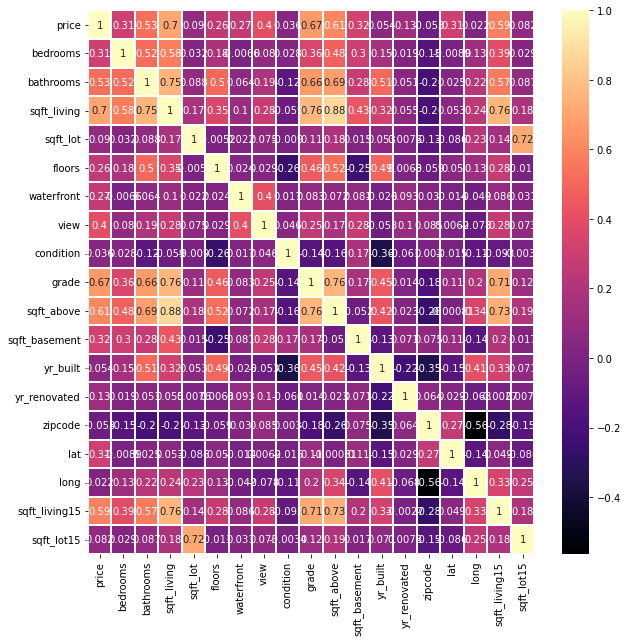

In [18]:
#create the correlation matrix heat map with annotation
plt.subplots(figsize=(10,10))
sns.heatmap(newHousingDF.drop('id', axis=1).corr(), linewidths=.1, annot=True, cmap='magma');
plt.yticks(rotation=0);

The heatmap let us know that there's a strong positive correlation between 'price' and 'sqft_living'(0.70), 'grade'(0.67), and 'sqft_above'(0.61). 

There is also a strong correlation between 'grade' and 'sqft_above'(0.76).

I am going to use a scatter plot to show the correlation between 'grade' and 'sqft_above'

[Text(0.5, 1.0, 'Grade vs Sqft_above')]

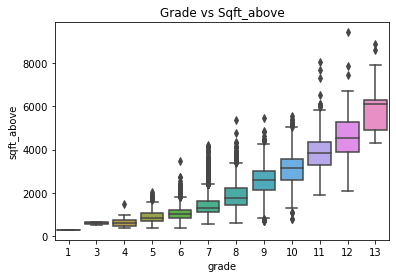

In [19]:
#scatter plot between grade and sqft_above
#sns.scatterplot(data=newHousingDF, x="grade", y="sqft_above", hue="grade").set(title='Grade vs Sqft_above')

sns.boxplot(x="grade", y="sqft_above", data=newHousingDF).set(title='Grade vs Sqft_above')

The scatter plot shows that some the higher grade homes had larger sqft_above. With the positive correlation between price and 'sqft_above',it is indicated that the better the grade of the house, the higher 'sqft_above' which will have a higher price.

## 3.3 Scatter Plots

In [20]:
# define useful function to create scatterplots of house prices against desired columns
def scatterplots(columns, ncol=None, figsize=(15, 15)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'price', data=newHousingDF, alpha=0.5)
        ax.set(xlabel=col, ylabel='House price')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [21]:
features = [x for x in newHousingDF.columns if x not in ['id', 'date', 'price']]
#'lat', 'long', 'sqft_lot15', 'sqft_living15'

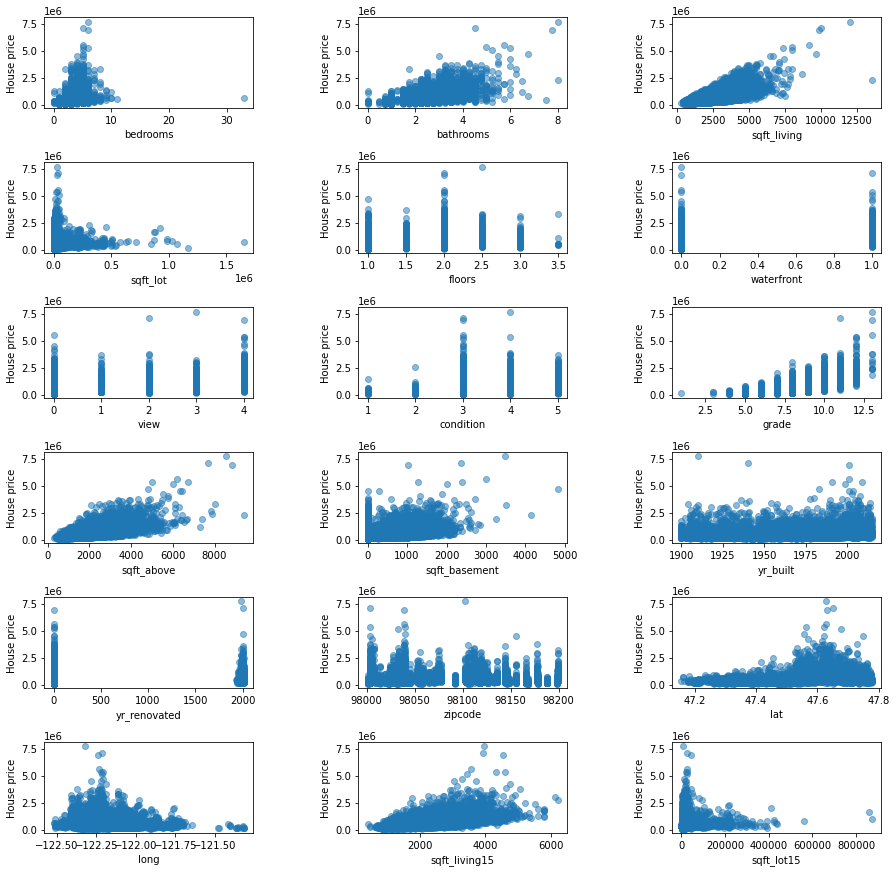

In [22]:
scatterplots(features, ncol=3, figsize=(15, 15))

Based on the scatter plots, we can see that 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_renovated', and 'zipcode' would be considered categorical variables.

## 3.4 Get Percent Ranking Base on Price

### <b>House Price Percentage based on average zip code</b>

In [23]:
#eight = dfavgzip[dfavgzip['bin'] == '80-90%'].mean()
#top10 = dfavgzip[dfavgzip['bin'] == 'Top 10%'].mean()

#(top10 - eight) / top10

In [24]:
#percent ranking
df = newHousingDF.copy()

labels = ['Bottom 10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', 'Top 10%']
bins = [0, 0.0999, 0.1999, 0.2999, 0.3999, 0.4999, 0.5999, 0.6999, 0.7999, 0.8999, 1]

df['PercentRank'] = pd.qcut(
    df['price'],
    bins,
    labels = labels, 
    duplicates='drop')

df = df.sort_values(['zipcode', 'price'], ascending=False)
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,PercentRank
7907,1068000375,20140923T000000,3200000.0,6,5.00,7100,18200,2.5,0,0,...,5240.0,1860,1933,2002,98199,47.6427,-122.408,3130,6477,Top 10%
20535,1370800515,20141030T000000,2950000.0,4,4.25,4470,5884,2.0,0,1,...,3230.0,1240,2010,0,98199,47.6387,-122.405,2570,6000,Top 10%
11620,1069000070,20150415T000000,2795000.0,5,3.25,4590,12793,2.0,0,2,...,3590.0,1000,1928,0,98199,47.6453,-122.410,2920,8609,Top 10%
19323,5553300375,20140820T000000,2160000.0,3,3.50,3080,6495,2.0,0,3,...,2530.0,550,1996,2006,98199,47.6321,-122.393,4120,8620,Top 10%
15152,1370800225,20150318T000000,2152500.0,4,3.25,3840,6214,1.5,0,3,...,2590.0,1250,1939,0,98199,47.6388,-122.406,3280,5915,Top 10%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3402,3356403820,20141205T000000,115000.0,2,1.00,1000,16524,1.0,0,0,...,1000.0,0,1913,0,98001,47.2841,-122.255,1350,10208,Bottom 10%
12208,4031000520,20140708T000000,115000.0,1,2.00,1150,9812,1.0,0,0,...,1150.0,0,1962,0,98001,47.2951,-122.284,1200,9812,Bottom 10%
20962,1278000210,20150311T000000,110000.0,2,1.00,828,4524,1.0,0,0,...,828.0,0,1968,2007,98001,47.2655,-122.244,828,5402,Bottom 10%
1218,3751600030,20140717T000000,100000.0,2,1.00,770,17334,1.0,0,0,...,770.0,0,1978,0,98001,47.2997,-122.269,1480,17334,Bottom 10%


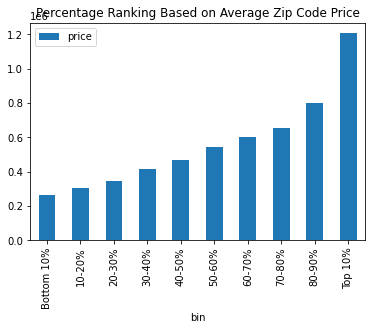

In [25]:


avgZip = df.groupby(['zipcode']).price.mean()

bins = [0, 0.0999, 0.1999, 0.2999, 0.3999, 0.4999, 0.5999, 0.6999, 0.7999, 0.8999, 1]
labels = ['Bottom 10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', 'Top 10%']

dfavgzip = pd.DataFrame(avgZip)
dfavgzip['bin']=pd.qcut(avgZip, bins, labels=labels,duplicates='drop')

dfavgzip.groupby('bin').mean().plot(kind='bar')


plt.title("Percentage Ranking Based on Average Zip Code Price")
plt.show()

### <b>Boxplot Based on All House Prices</b>

Now I am going to show boxplots based on their 'PercentRank' category

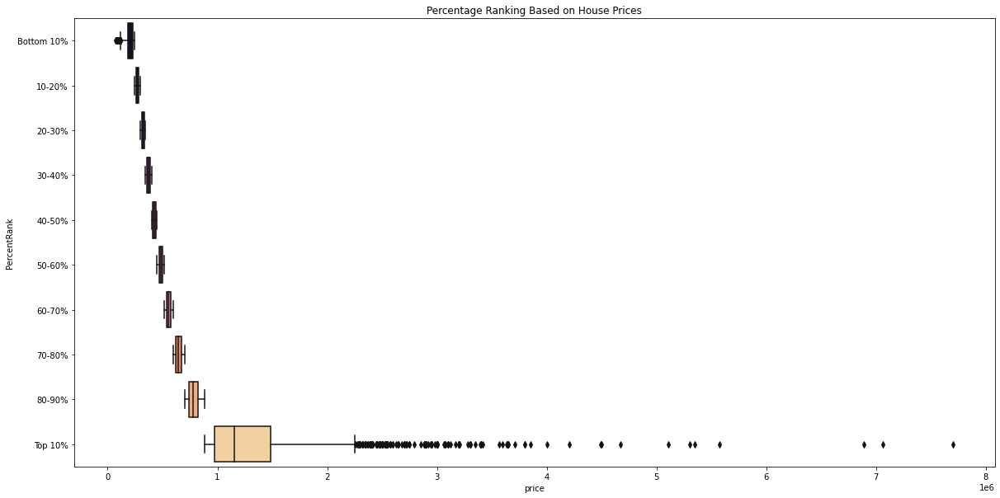

In [26]:
#create a box plot

figure, ax = plt.subplots(figsize=(20,10))
ax.set_title('Percentage Ranking Based on House Prices')

ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.get_major_formatter().set_useOffset(False)

ax = sns.boxplot(data=df, 
                 y='PercentRank', 
                 x='price', 
                 orient='h',
                 palette = 'magma')

It's difficult to see every single boxplot, so I am going to show the percent ranking with a barchart.

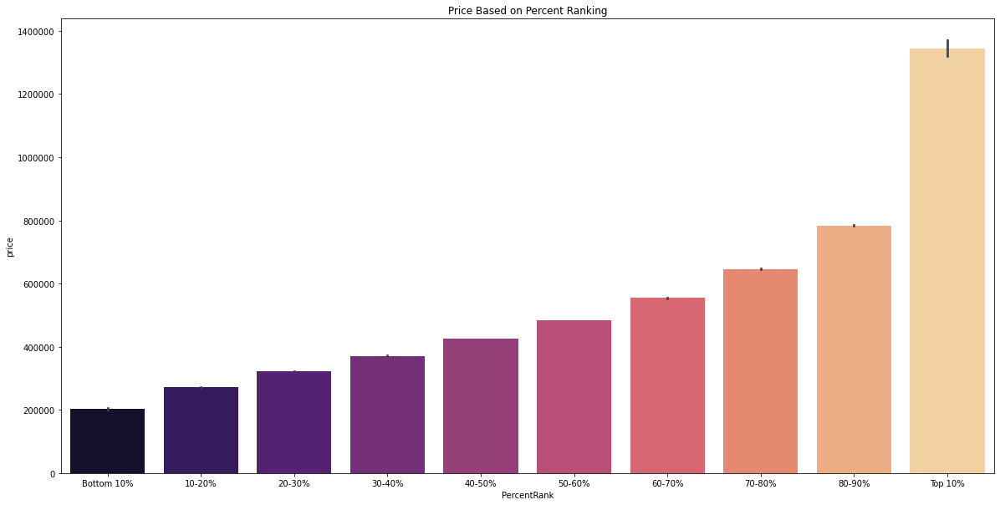

In [27]:
#create a barplot
#color palette: husl, plasma

figure, ax = plt.subplots(figsize=(20,10))
ax.set_title('Price Based on Percent Ranking')

ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.get_major_formatter().set_useOffset(False)

ax = sns.barplot(data=df, 
                 x='PercentRank', 
                 y='price', 
                 palette = 'magma')

### Get the range of the houses based on zipcode

In [28]:
#find range
minPrice = newHousingDF.groupby(['zipcode']).price.min()
maxPrice = newHousingDF.groupby(['zipcode']).price.max()

#get the range 
range_per_zip = maxPrice - minPrice

#Top highest rangest based on zip code
range_per_zip.sort_values(ascending=False).head()

zipcode
98102    7370000.0
98004    6637500.0
98039    6097500.0
98033    4980800.0
98040    4800000.0
Name: price, dtype: float64

## 3.5 View the Distribution of the Data

View some of the distribution based on the categorical features

### View distribution based on bedrooms

<Figure size 720x288 with 0 Axes>

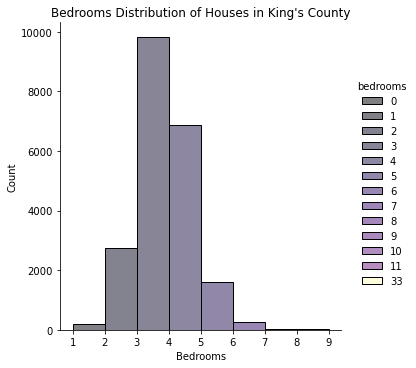

In [29]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="bedrooms", bins=[1,2,3,4,5,6,7,8,9], hue='bedrooms', palette='magma').set(xlabel='Bedrooms', title="Bedrooms Distribution of Houses in King's County")

plt.show()

There is an outlier with 33 bedrooms which we might not need in the future.

### View distribution based on waterfront

<Figure size 720x288 with 0 Axes>

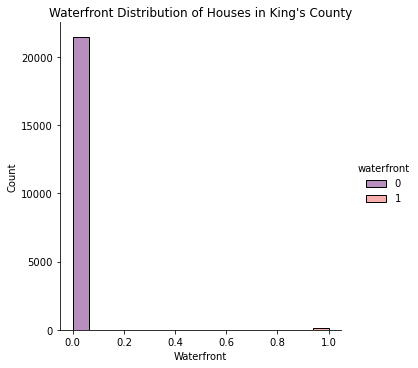

In [30]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="waterfront", hue='waterfront', palette='magma').set(xlabel='Waterfront', title="Waterfront Distribution of Houses in King's County")

### View distribution based on view

<Figure size 720x288 with 0 Axes>

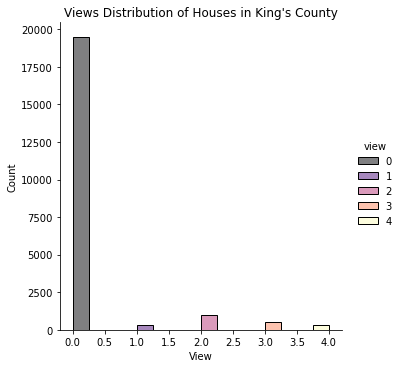

In [31]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="view", hue='view', palette='magma').set(xlabel='View', title="Views Distribution of Houses in King's County")

### View distribution based on condition

<Figure size 720x288 with 0 Axes>

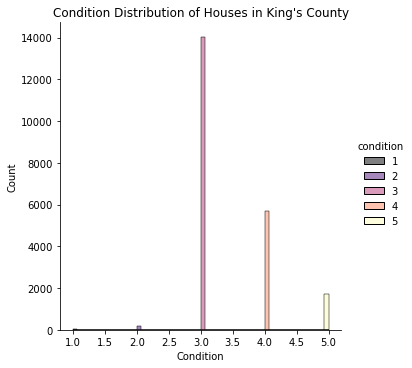

In [32]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="condition",hue='condition', palette='magma').set(xlabel='Condition', title="Condition Distribution of Houses in King's County")

### View distribution based on grade

<Figure size 720x288 with 0 Axes>

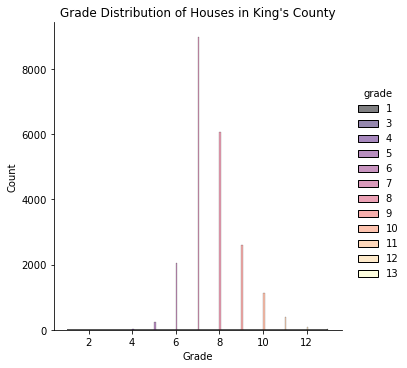

In [33]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="grade",hue='grade', palette='magma').set(xlabel='Grade', title="Grade Distribution of Houses in King's County")

## 3.5 Price vs features

date  
price
bedrooms
bathrooms
sqft_living
sqft_lot 
floors 
waterfront
view 
condition
grade
sqft_above 
sqft_basement
yr_built 
yr_renovated
zipcode
lat 
long
sqft_living15
sqft_lot15


In your notebook - we should have bivariate charts for every single feature vs price (not as a pair plot, do them in separate cells and choose the appropriate chart) 
If its continuous - you’ll want a scatter plot
If its categorical - you’ll want a box plot
If you’re not sure, you can do both

floors', 'waterfront', 'view', 'condition', 'grade', 'yr_renovated', and 'zipcode'

#### Price vs Date

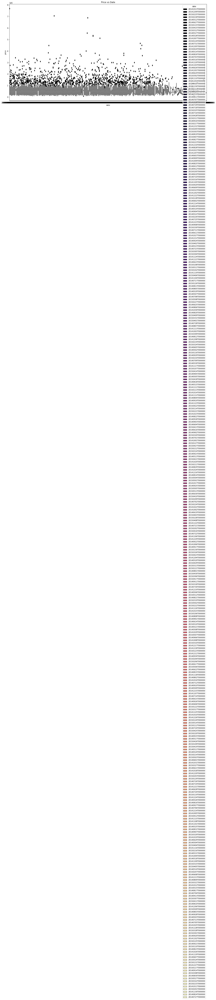

In [34]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="date", y="price", hue='date',
                 data=newHousingDF, palette='magma').set(title='Price vs Date')

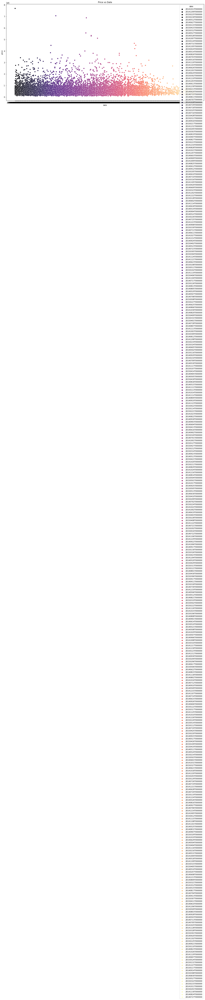

In [35]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="date", y="price", hue='date',
                 data=newHousingDF, palette='magma').set(title='Price vs Date')

#### Price vs bedrooms

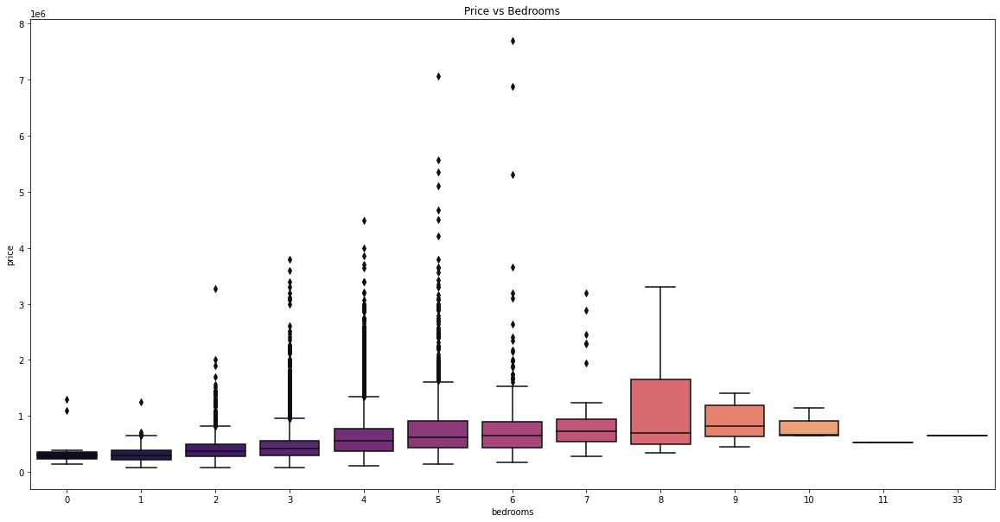

In [36]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="bedrooms", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Bedrooms')

#### Price vs bathrooms

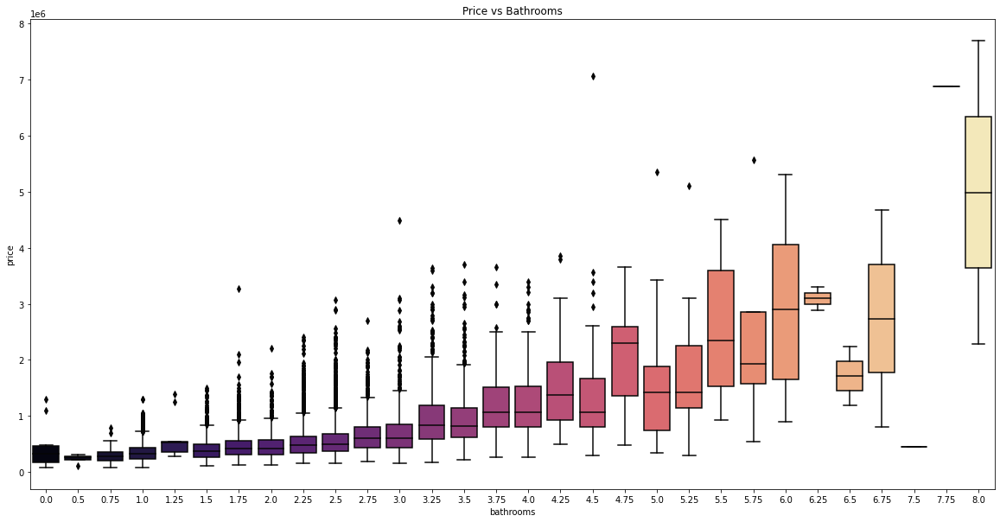

In [37]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="bathrooms", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Bathrooms')

#### Price vs sqft_living

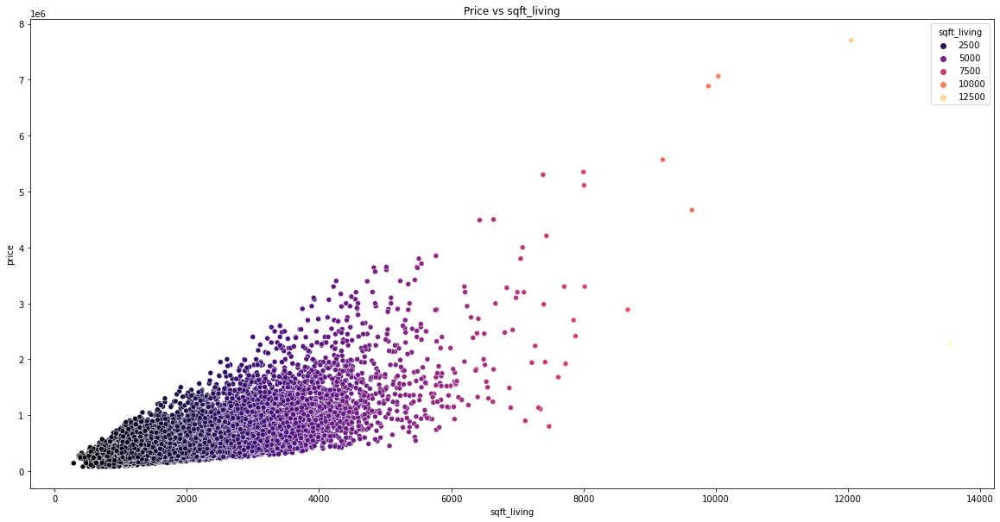

In [38]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_living", y="price", hue="sqft_living",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living')

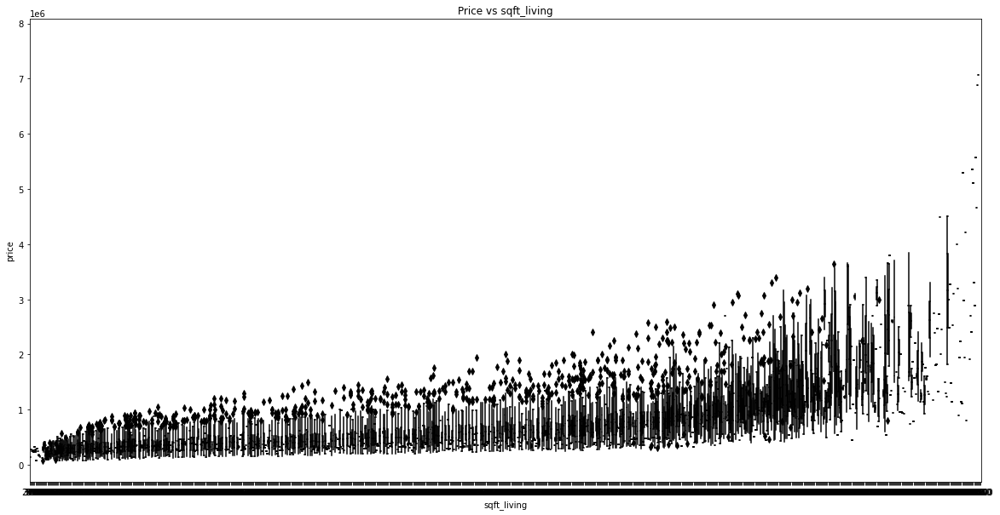

In [39]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_living", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living')

#### Price vs sqft_lot 

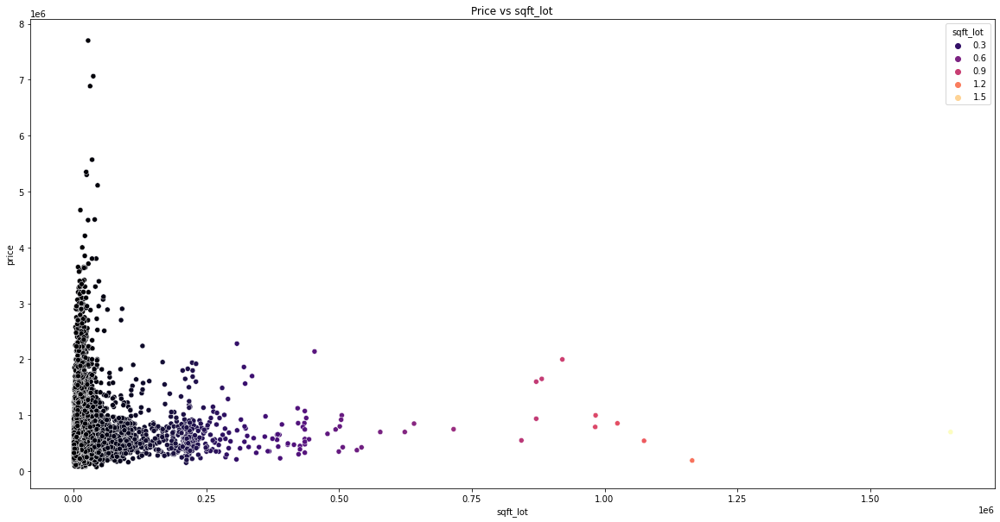

In [40]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_lot", y="price",hue="sqft_lot",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot')

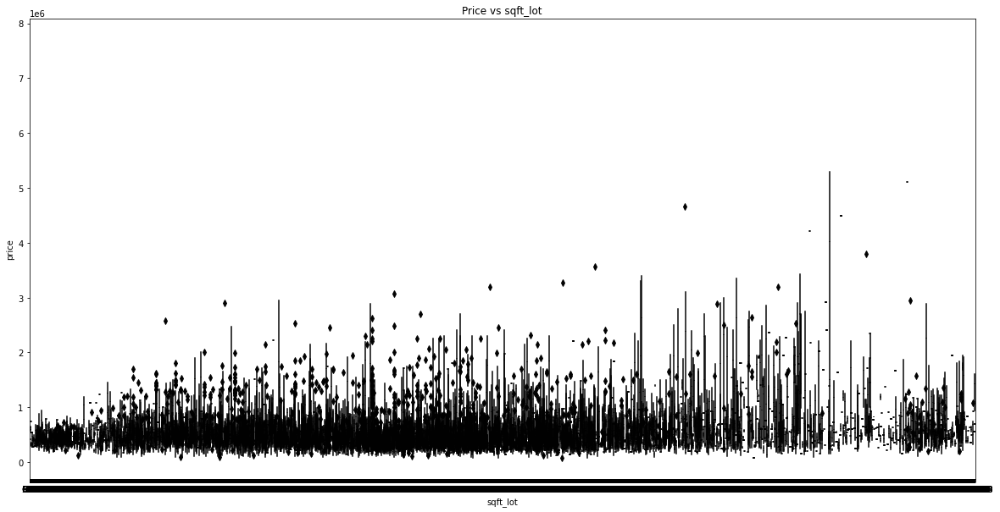

In [41]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_lot", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot')

#### Price vs floors

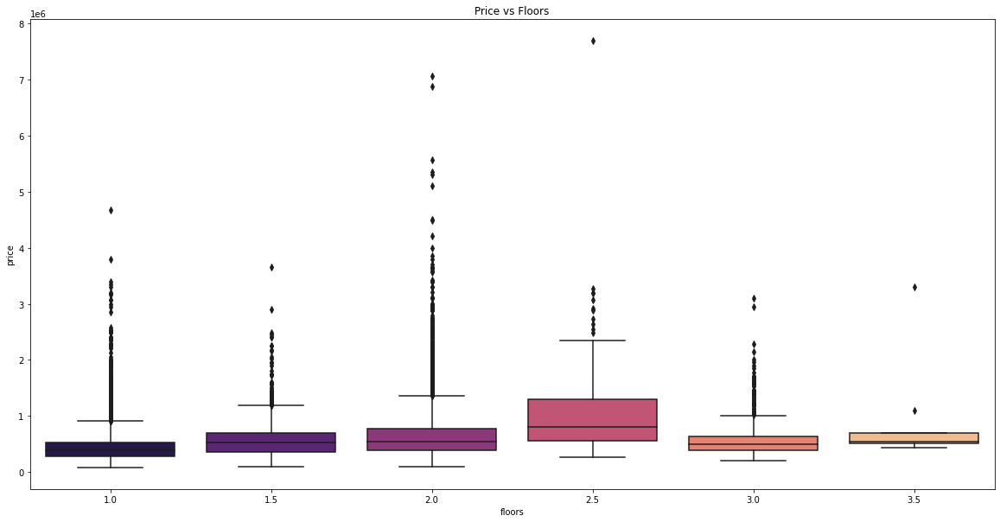

In [42]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="floors", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Floors')

#### Price vs waterfront

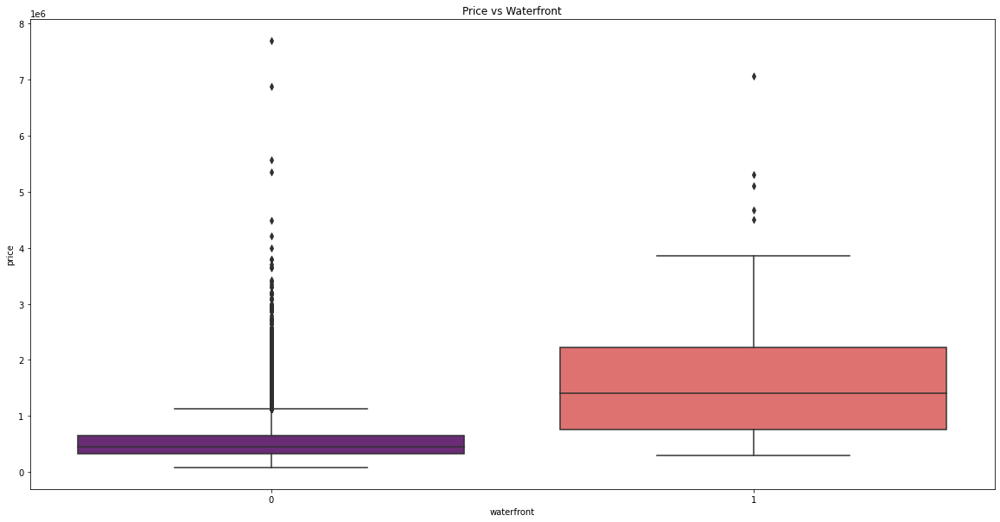

In [43]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="waterfront", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Waterfront')

#### Price vs view

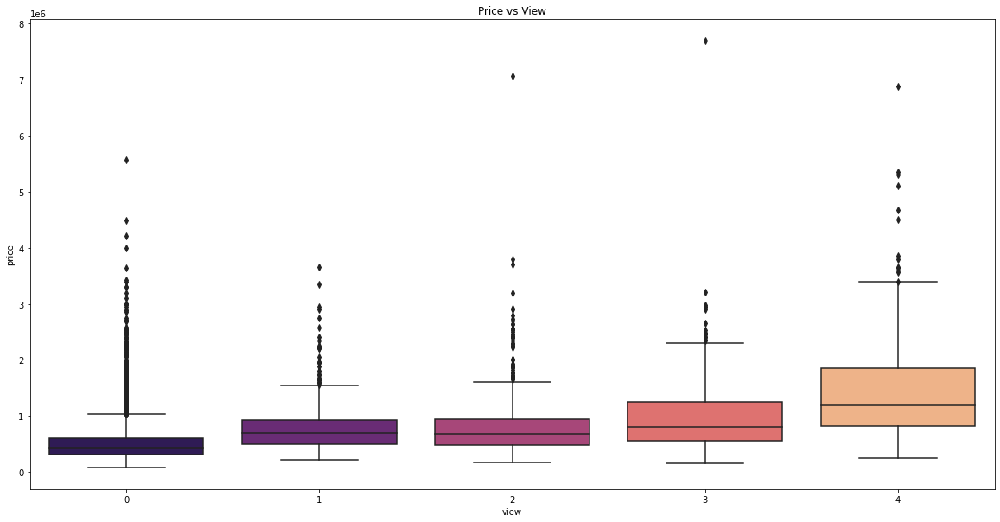

In [44]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="view", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs View')

#### Price vs condition

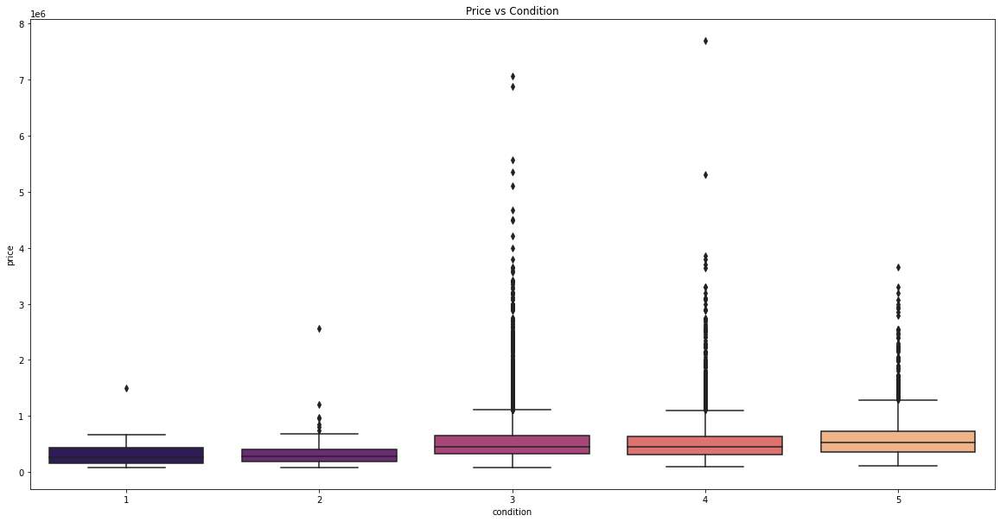

In [45]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="condition", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Condition')

#### Price vs grade

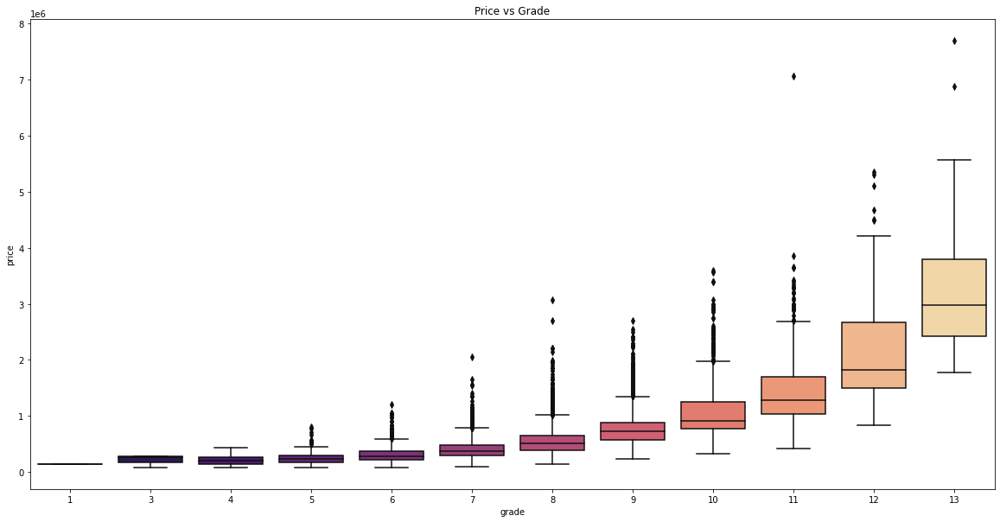

In [46]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="grade", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Grade')

#### Price vs sqft_above 

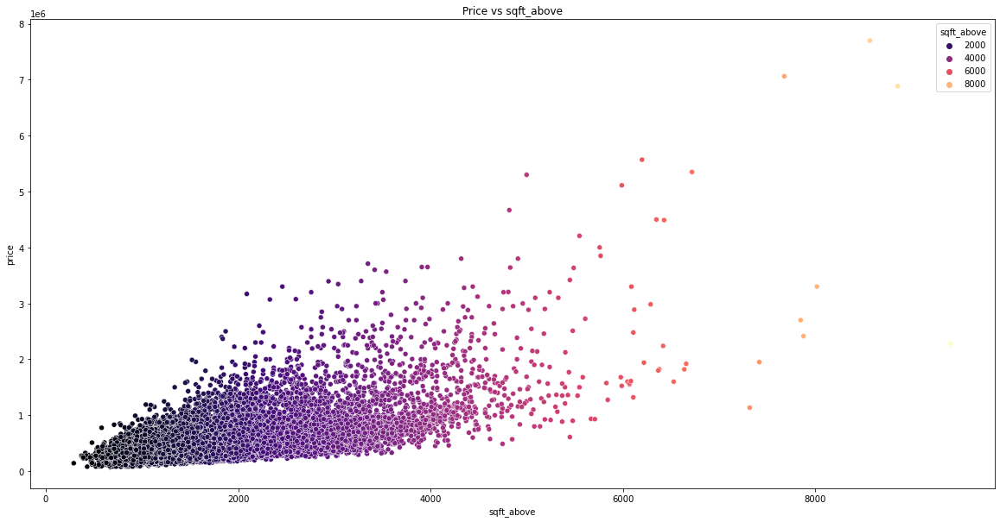

In [47]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_above", y="price", hue='sqft_above',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_above')

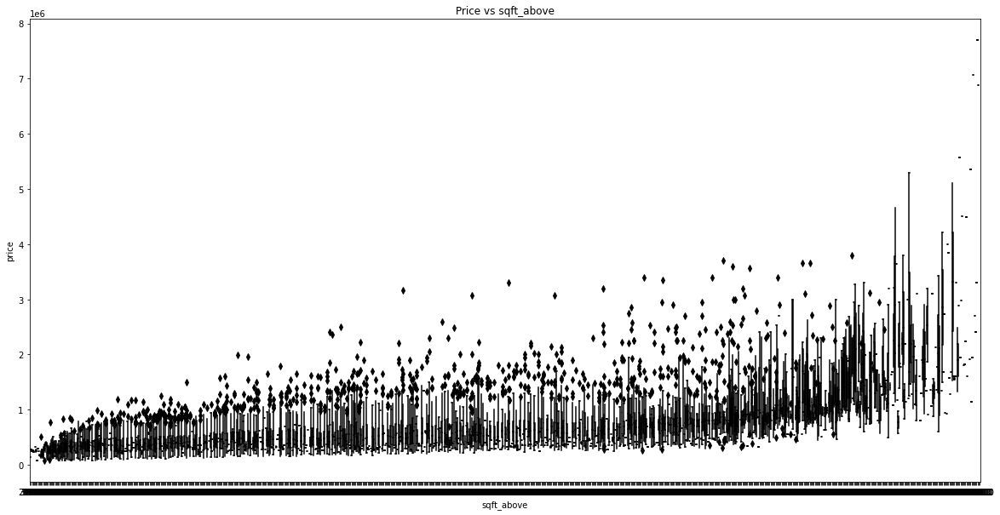

In [48]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_above", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_above')

#### Price vs sqft_basement

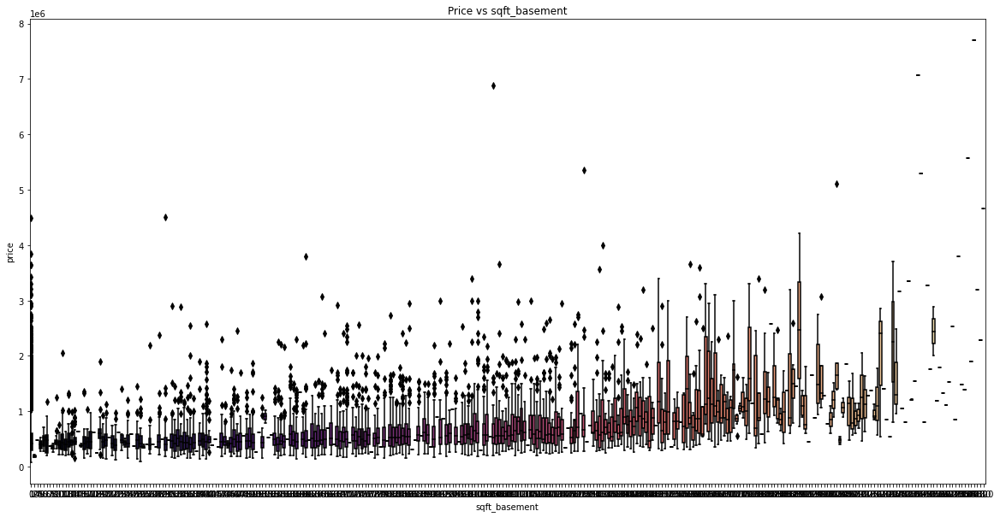

In [49]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_basement", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_basement')

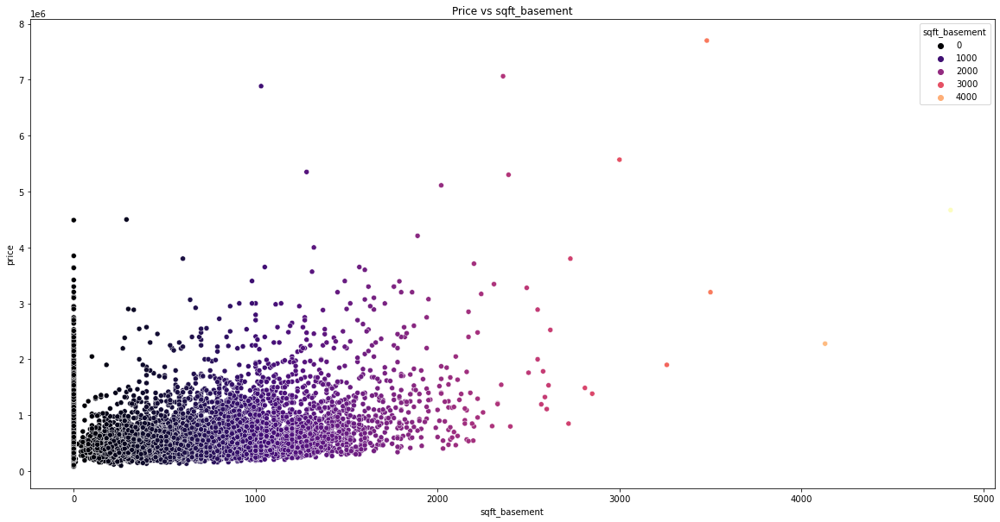

In [50]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_basement", y="price", hue='sqft_basement',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_basement')

#### Price vs yr_built

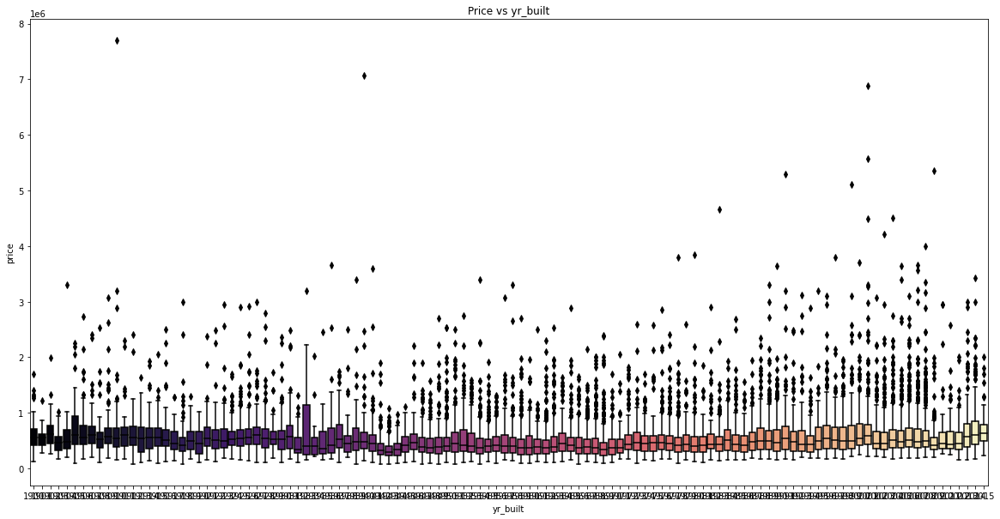

In [51]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="yr_built", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs yr_built')

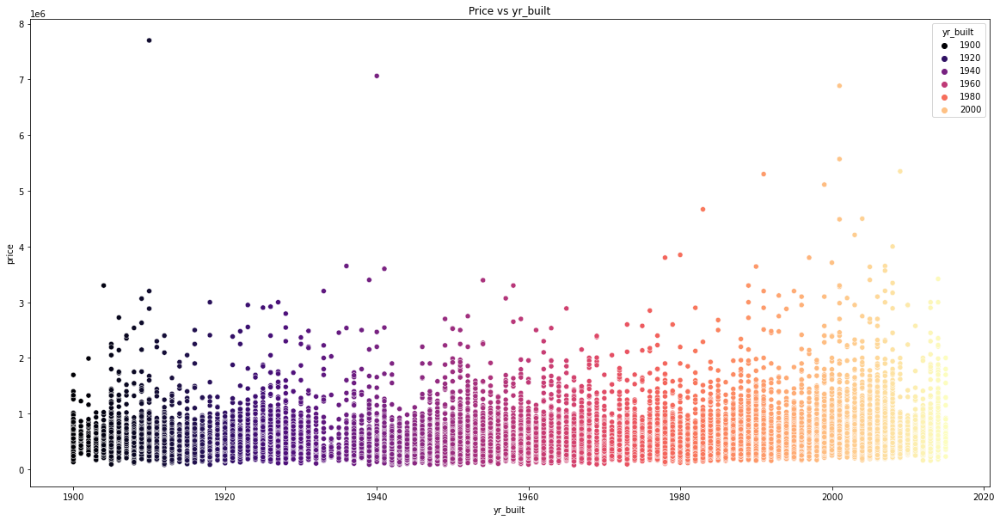

In [52]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="yr_built", y="price", hue='yr_built',
                 data=newHousingDF, palette='magma').set(title='Price vs yr_built')

#### Price vs yr_renovated

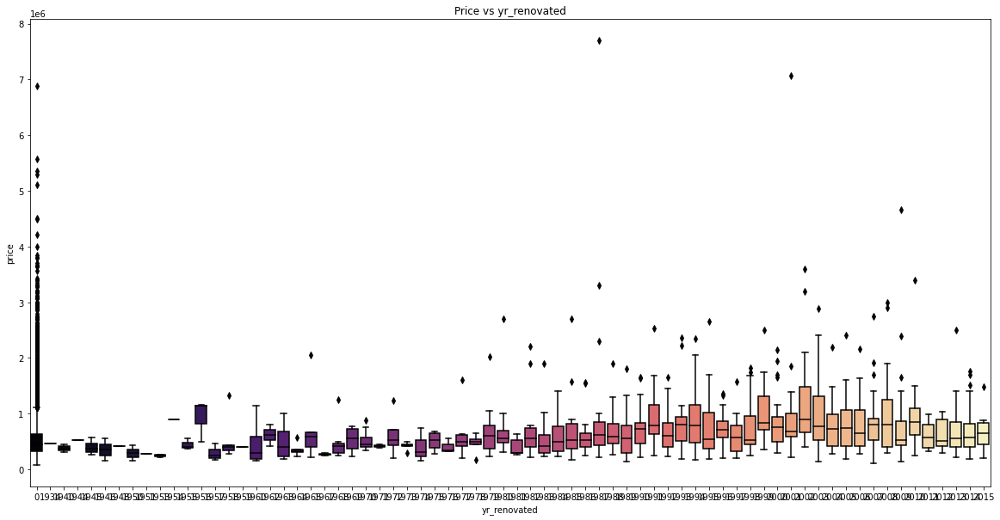

In [53]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="yr_renovated", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs yr_renovated')

#### Price vs zipcode

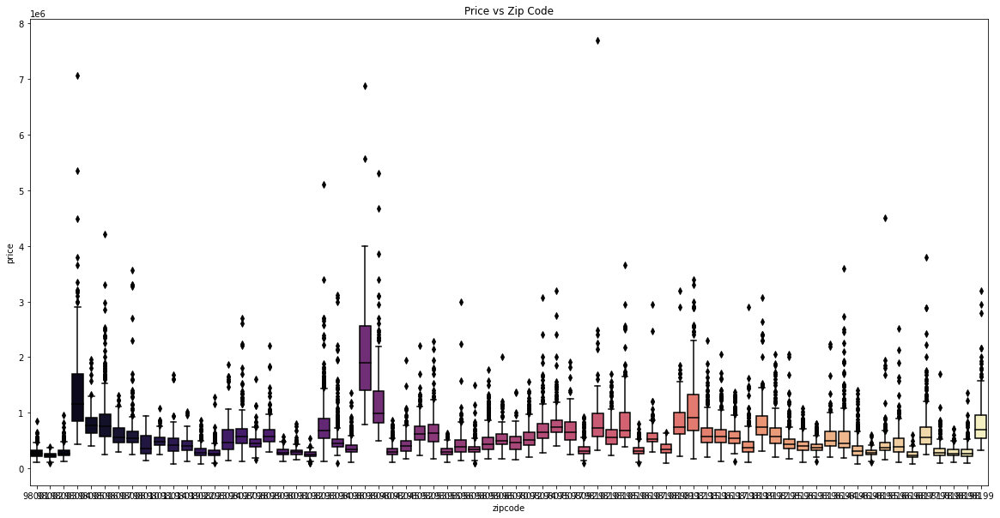

In [54]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="zipcode", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Zip Code')

#### Price vs lat

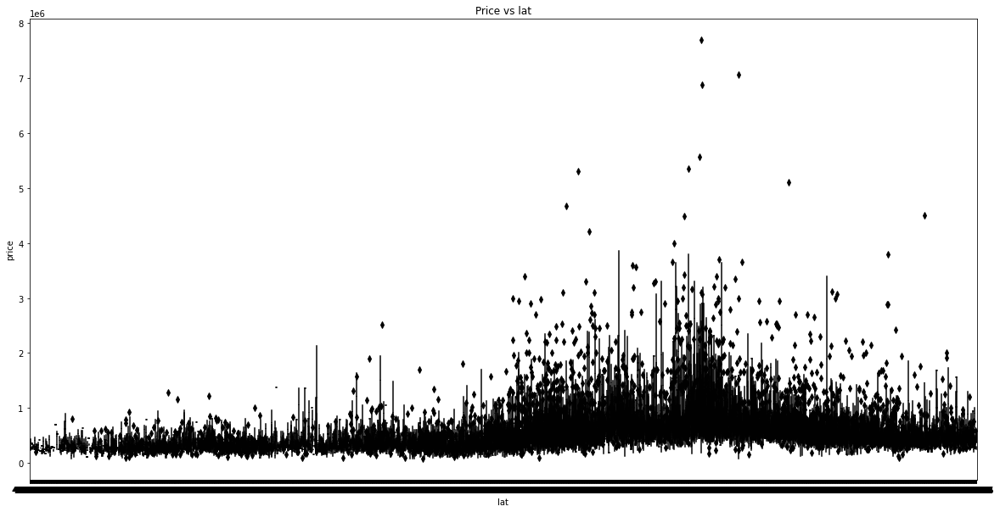

In [55]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="lat", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs lat')

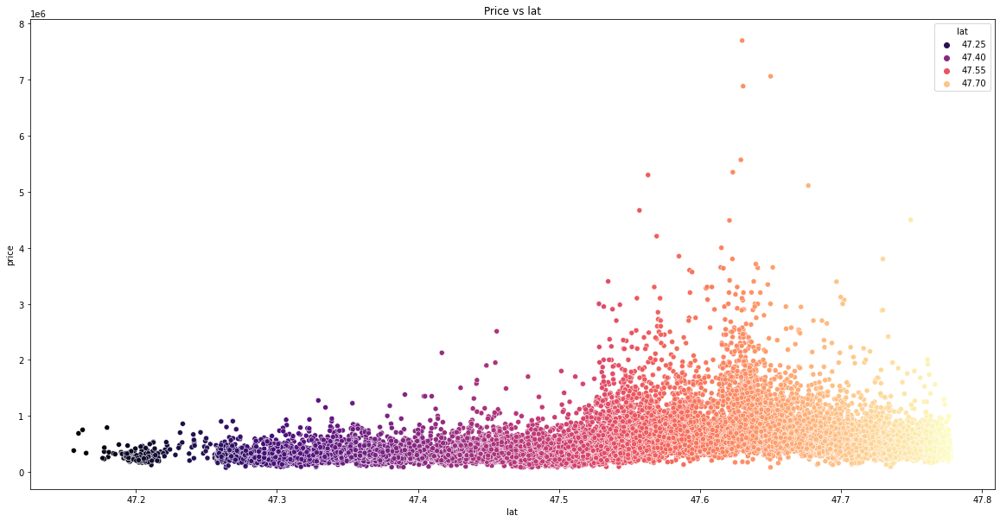

In [56]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="lat", y="price", hue='lat',
                 data=newHousingDF, palette='magma').set(title='Price vs lat')

#### Price vs long

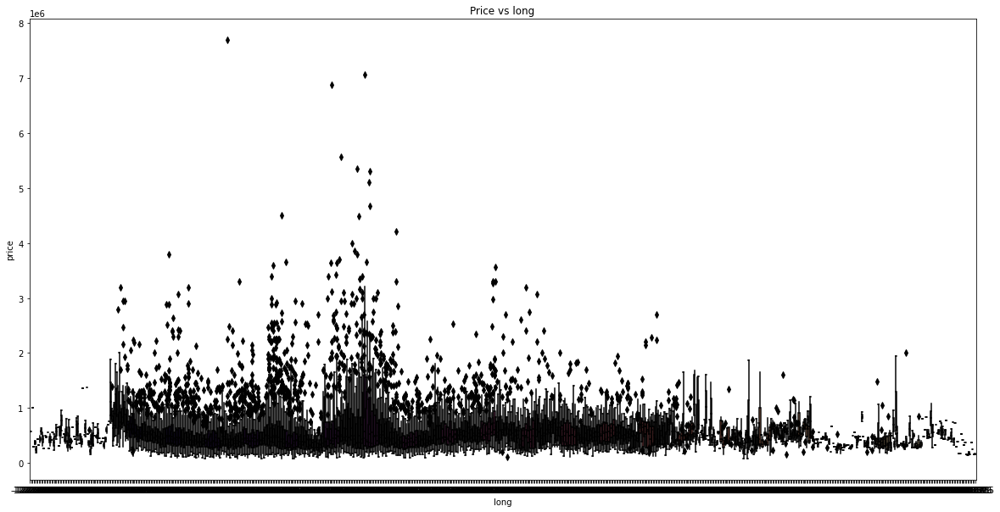

In [57]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="long", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs long')

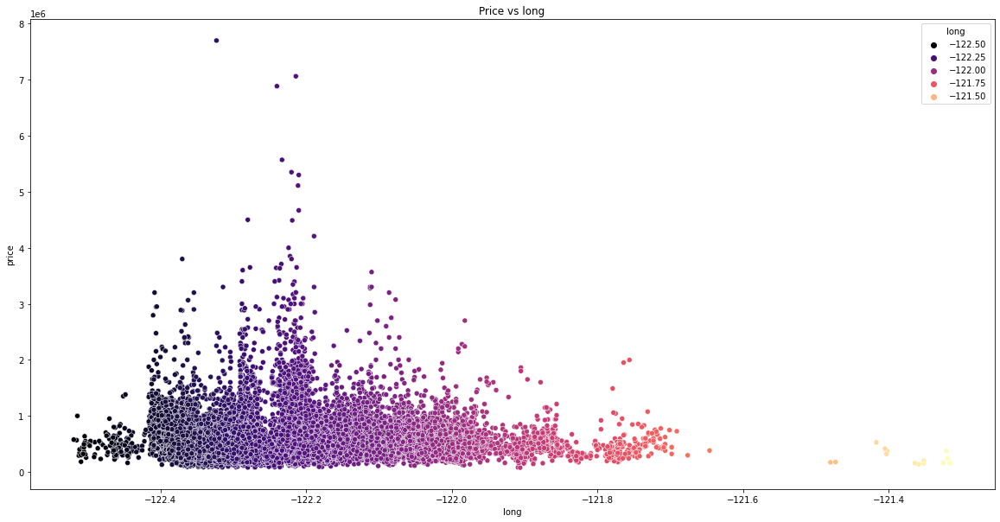

In [58]:
figure, ax = plt.subplots(figsize=(20,10)) 

ax = sns.scatterplot(x="long", y="price", hue='long',
                 data=newHousingDF, palette='magma').set(title='Price vs long')

#### Price vs sqft_living15

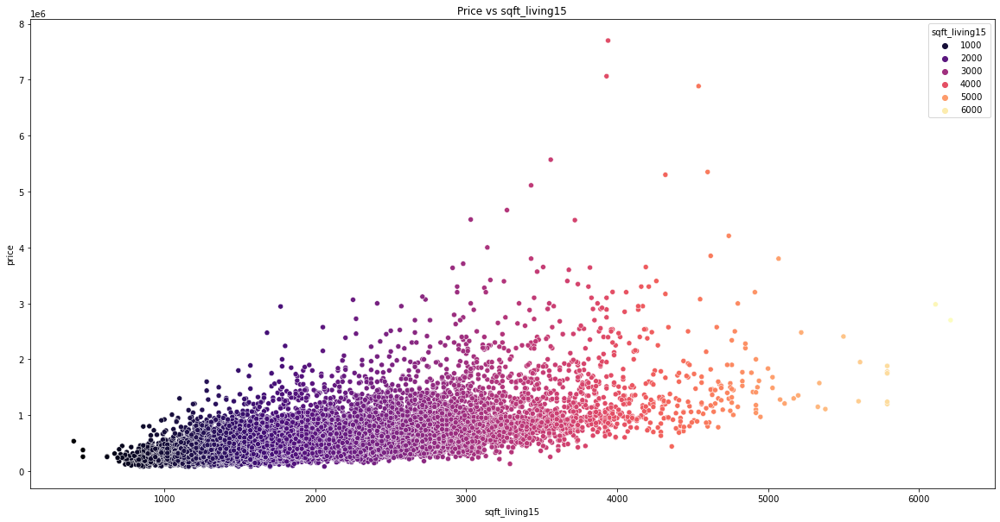

In [59]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_living15", y="price",hue="sqft_living15",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living15')

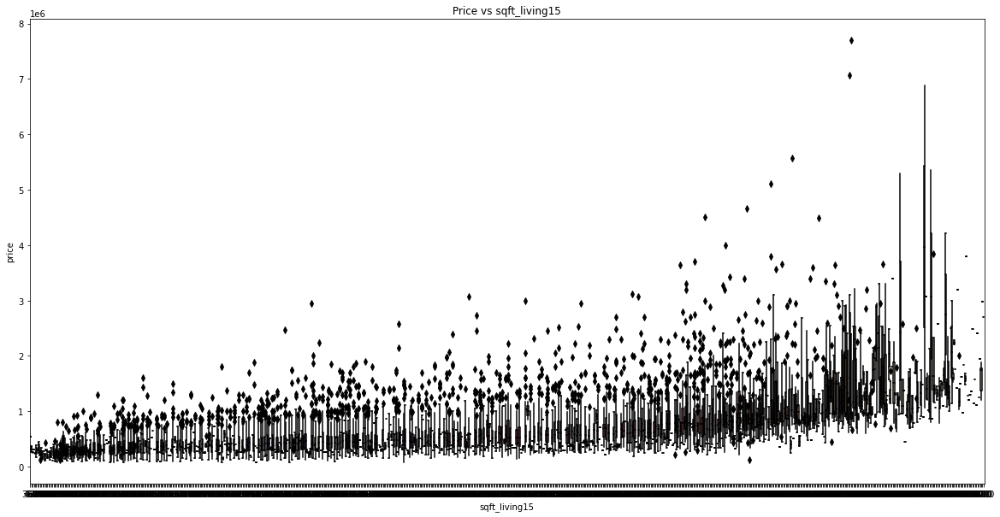

In [60]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_living15", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living15')

#### Price vs sqft_lot15

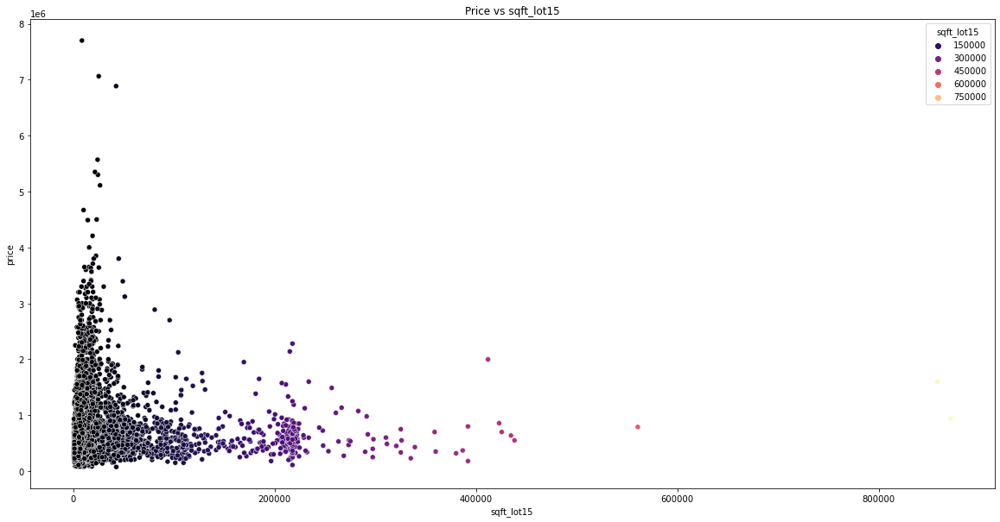

In [61]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.scatterplot(x="sqft_lot15", y="price", hue='sqft_lot15',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot15')

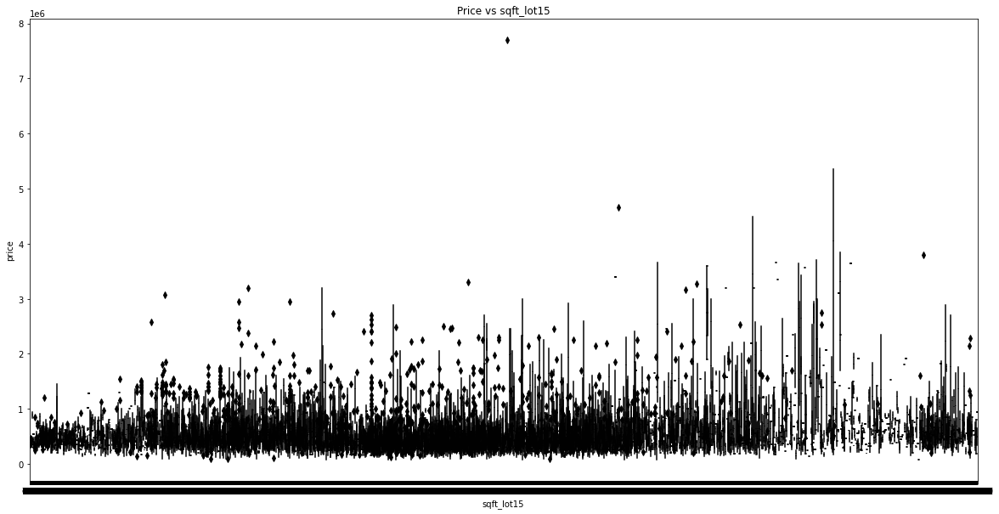

In [62]:
figure, ax = plt.subplots(figsize=(20,10))

ax = sns.boxplot(x="sqft_lot15", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot15')

# Summary 

Based on the scatter plots, we can see that 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_renovated', and 'zipcode' would be considered categorical variables.

Based on the heatmap, here's a strong positive correlation between 'price' and 'sqft_living', 'grade', and 'sqft_above'. There is also a strong correlation between 'grade' and 'sqft_above'

These features will affect our house price.